In [1]:
from pathlib import Path
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import math

In [2]:
sns.set_theme(context='notebook', style='whitegrid', palette='muted')

In [3]:
from sklearn.preprocessing import StandardScaler, RobustScaler

In [4]:
data_dir = Path('../../results')
train = pd.read_csv(data_dir / 'train_clean.csv')

In [5]:
num_cols = train.dtypes[(train.dtypes == 'float64') | (train.dtypes == 'int64')].index
num_cols

Index(['startYear', 'runtimeMinutes', 'numVotes', 'totalImages',
       'totalCredits', 'numRegions', 'companiesNumber', 'averageRating',
       'externalLinks', 'writerCredits', 'numGenres', 'criticReviewsRatio'],
      dtype='object')

In [6]:
scaler = RobustScaler()
train_X = scaler.fit_transform(train[num_cols])

## HBOS

In [7]:
from pyod.models.hbos import HBOS

In [8]:
def sturges_law(N):
    return 1 + math.log(N, 2)

sturges_law(train_X.shape[0])

17.675405775802762

In [9]:
detector = HBOS(n_bins='auto', contamination=0.01)

In [10]:
detector.fit(train_X)

HBOS(alpha=0.1, contamination=0.01, n_bins='auto', tol=0.5)

In [11]:
outliers = detector.predict(train_X)

In [12]:
threshold = detector.decision_scores_[np.where(outliers == 1)].min()

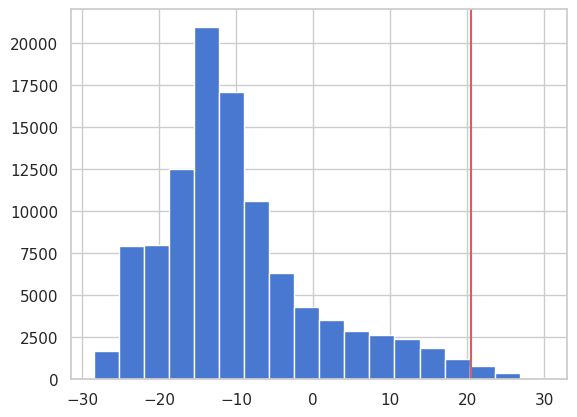

In [13]:
plt.hist(detector.decision_scores_, bins=18)
plt.axvline(threshold, c='r')
plt.show()

### Analysis of candidate outliers

In [14]:
train['hbos'] = outliers == 1

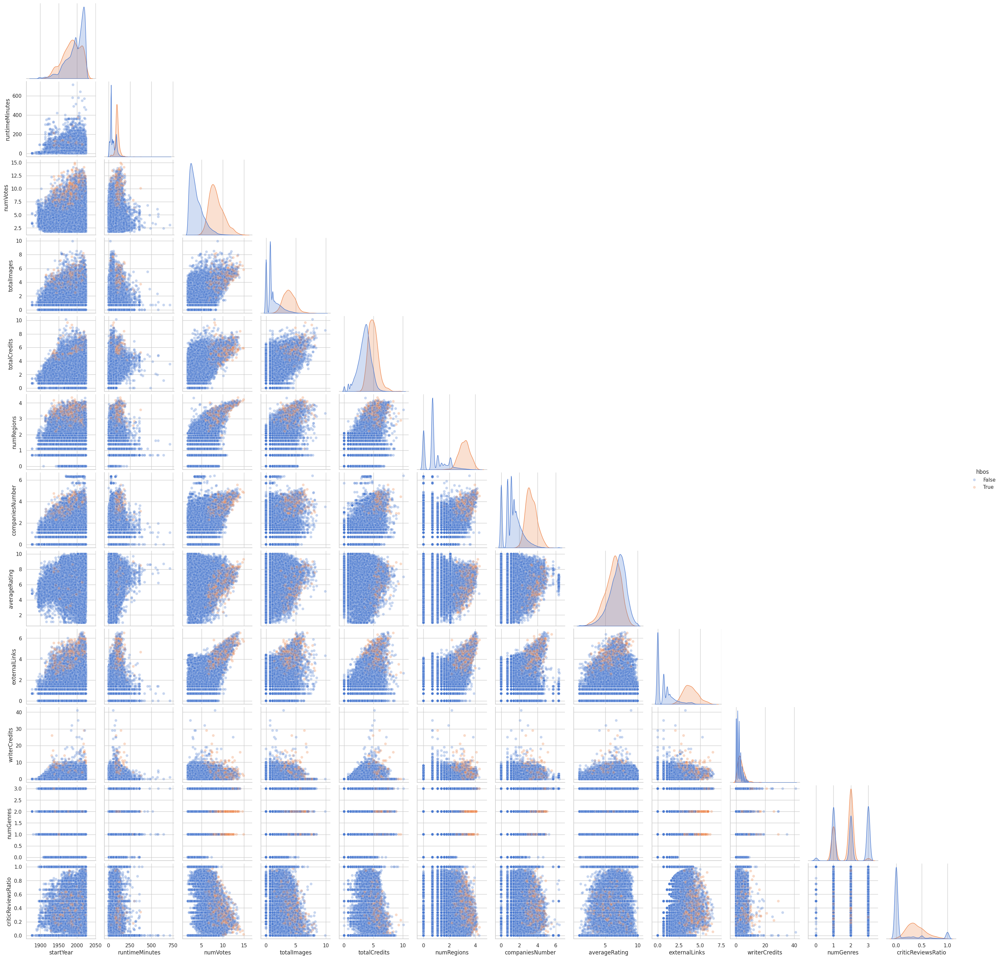

In [15]:
sns.pairplot(train, vars=num_cols, hue='hbos',
             diag_kind='kde', diag_kws=dict(common_norm=False),
             plot_kws=dict(alpha=.3), corner=True)

In [16]:
train[train['hbos']]['titleType'].value_counts()

titleType
movie           967
tvSeries         37
video            18
tvMovie          14
short             4
tvMiniSeries      4
tvSpecial         3
Name: count, dtype: int64

In [17]:
train[train['hbos']].sort_values('numVotes', ascending=False).head(20)

,originalTitle,rating,startYear,runtimeMinutes,numVotes,totalImages,totalCredits,titleType,canHaveEpisodes,numRegions,...,criticReviewsRatio,hasAwards,hasAwardsOrNominations,hasVideos,hasCriticsReviews,hasUserReviews,moreDirectorsCredits,hasQuotes,moreCountriesOfOrigin,hbos
89936,The Shawshank Redemption,"(9, 10]",1994,142.0,14.896614,5.802118,5.883322,movie,False,4.204693,...,0.015694,True,True,True,True,True,False,True,False,True
76320,Pulp Fiction,"(8, 9]",1994,154.0,14.632531,6.381816,5.874931,movie,False,4.110874,...,0.069589,True,True,True,True,True,False,True,False,True
16857,Avengers: Endgame,"(8, 9]",2019,181.0,14.079606,6.909753,8.383890,movie,False,4.094345,...,0.052585,True,True,True,True,True,True,True,False,True
102029,Good Will Hunting,"(8, 9]",1997,126.0,13.906790,6.421622,6.270988,movie,False,4.043051,...,0.128983,True,True,True,True,True,False,True,False,True
100497,Le fabuleux destin d'Amélie Poulain,"(8, 9]",2001,122.0,13.597504,5.153292,5.758902,movie,False,3.931826,...,0.087125,True,True,True,True,True,False,True,True,True
59574,Full Metal Jacket,"(8, 9]",1987,116.0,13.596293,5.521461,5.602119,movie,False,3.988984,...,0.147899,True,True,True,True,True,False,True,True,True
95088,Aliens,"(8, 9]",1986,137.0,13.574820,6.165418,5.690359,movie,False,4.330733,...,0.118063,True,True,True,True,True,False,True,True,True
17791,Fargo,"(8, 9]",1996,98.0,13.510810,4.969813,5.517453,movie,False,3.891820,...,0.110000,True,True,True,True,True,True,True,True,True
8832,Transformers,"(7, 8]",2007,144.0,13.435468,6.240276,7.482682,movie,False,3.970292,...,0.168729,True,True,True,True,True,False,True,False,True
73573,Better Call Saul,"(8, 9]",2015,45.0,13.430886,7.809541,7.487174,tvSeries,True,3.850148,...,0.077297,True,True,True,True,True,False,True,False,True


It looks like HBOS is identifying as outliers mainly movies, and very popular movies at that. In addition to that, a great majority of titles identified as outliers have received awards or nominations (a condition which is true only for a minority of the total records of the dataset).

In [18]:
pd.crosstab(train['hasAwardsOrNominations'], train['hbos'])

hbos,False,True
hasAwardsOrNominations,,
False,91444,399
True,12173,648


### Visualization in latent space

In [19]:
from sklearn.decomposition import PCA

In [20]:
pca = PCA()
pca_train = pca.fit_transform(train_X)

In [21]:
explained_variance = pca.explained_variance_ratio_

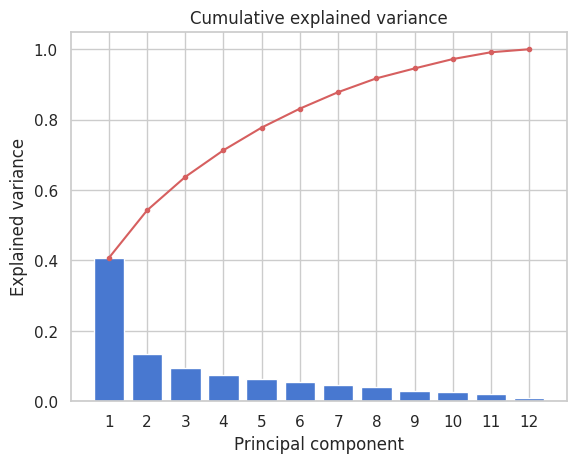

In [22]:
x = list(range(1, len(explained_variance) + 1))
plt.bar(x, height=explained_variance)
plt.xticks(x)
plt.plot(x, explained_variance.cumsum(), 'r.-')
plt.xlabel("Principal component")
plt.ylabel("Explained variance")
plt.title("Cumulative explained variance")
plt.show()

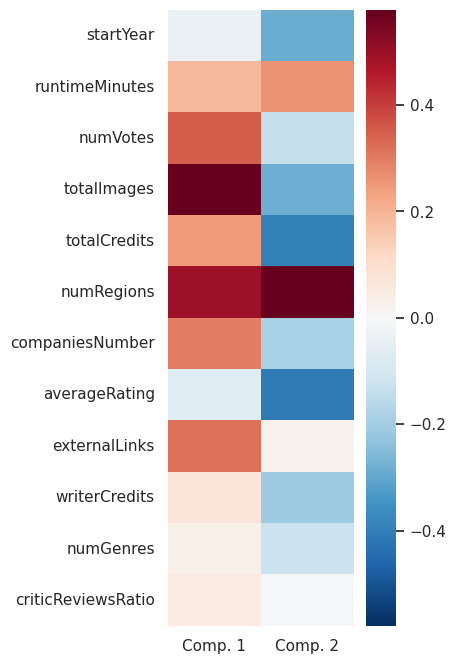

In [23]:
n_comp = 2

components = pca.components_[:n_comp].T
vmax = np.abs(components).max()

plt.figure(figsize=(1+n_comp, 8))
sns.heatmap(components, cmap='RdBu_r', vmax=vmax, vmin=-vmax)
plt.xticks(np.arange(n_comp) + .5, labels=[f'Comp. {i+1}' for i in range(n_comp)])
plt.yticks(ticks=np.arange(len(num_cols)) + .5, labels=num_cols, rotation=0)
plt.show()

In [24]:
pca_train = pd.DataFrame(pca_train)
pca_train['outlier'] = train['hbos']
pca_train['title'] = train['originalTitle'] + ' (' + train['startYear'].astype(str) + ')'

In [25]:
avengers = pca_train.loc[16857]
pulp_fiction = pca_train.loc[76320]
meglio_gioventu = pca_train.loc[82663]
arrowprops = dict(arrowstyle='->', ls='-', color='black')

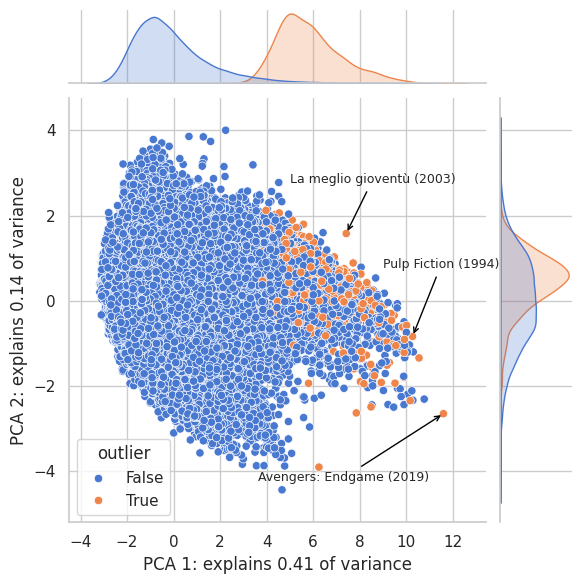

In [26]:
x, y = (0, 1)
sns.jointplot(pca_train, x=x, y=y, hue='outlier',
              marginal_kws=dict(common_norm=False))
plt.xlabel(f"PCA 1: explains {round(explained_variance[x], 2)} of variance")
plt.ylabel(f"PCA 2: explains {round(explained_variance[y], 2)} of variance")
plt.annotate(avengers['title'], xy=(avengers[x], avengers[y]), xytext=(11, -4),
             ha='right', va='top', arrowprops=arrowprops,
             fontsize=9)
plt.annotate(pulp_fiction['title'], xy=(pulp_fiction[x], pulp_fiction[y]),
             ha='left', va='top', xytext=(9, 1),
             fontsize=9, arrowprops=arrowprops)
plt.annotate(meglio_gioventu['title'], xy=(meglio_gioventu[x], meglio_gioventu[y]),
             ha='left', va='top', xytext=(5, 3),
             fontsize=9, arrowprops=arrowprops)
plt.show()

Interactive version of the same plot for our entertainment.

In [27]:
import plotly.express as px

In [28]:
px.scatter(pca_train, x=0, y=1, color='outlier', opacity=.5, hover_name='title')

In [29]:
from sklearn.manifold import TSNE

In [30]:
tsne = TSNE(n_components=2)
tsne_train = tsne.fit_transform(train_X)

In [31]:
tsne_train = pd.DataFrame(tsne_train)
tsne_train['outlier'] = train['hbos']
tsne_train['title'] = train['originalTitle'] + train['startYear'].astype(str)

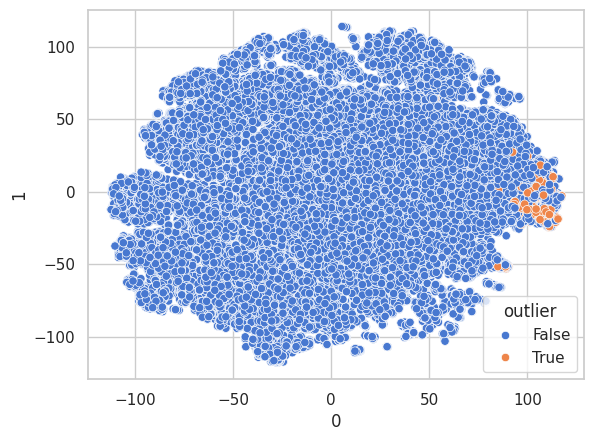

In [32]:
sns.scatterplot(tsne_train, x=0, y=1, hue='outlier')
plt.show()

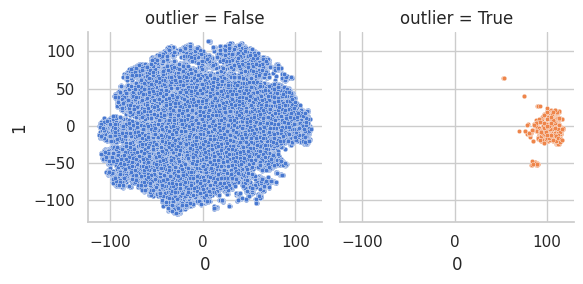

In [33]:
grid = sns.FacetGrid(tsne_train, col='outlier', hue='outlier')
grid.map_dataframe(sns.scatterplot, x=0, y=1, s=10)
plt.show()